In [133]:
from scipy import signal
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from glob import glob
import random

In [134]:
def gray(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray

# Function to Draw Epipolar Lines on the Given Images
def drawlines(img1,img2,lines,pts1,pts2):
    r,c = img1.shape
    img1 = cv2.cvtColor(img1,cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2,cv2.COLOR_GRAY2BGR)
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1[0]),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2[0]),5,color,-1)
    return img1,img2

# Function to draw matches given the images
def draw_matches(image, matches, window_size, draw_lines = False):
    h, w, _ = image.shape

    image2 = image.copy()
    
    for match in matches:
        color = tuple(np.random.randint(0,255,3).tolist())
        start = (int(match[1] + window_size//2), int(match[0] + window_size//2))        
        end   = (int(match[3] + window_size//2 + w//2), int(match[2] + window_size//2))
        if draw_lines:
            image2 = cv2.line(image2, start, end, color, 3)
        image2 = cv2.circle(image2,start,6,(0, 0, 0),-1)
        image2 = cv2.circle(image2,start,5,color,-1)
        image2 = cv2.circle(image2,end,6,(0, 0, 0),-1)
        image2 = cv2.circle(image2,end,5,color,-1)
    return image2

# Question 1 :  Intensity Window-based correlation

### Normalised Cross Correlation

* \begin{equation}
    I^{'}_{1} = I_{1} - avg(I_1) \\
    I^{'}_{2} = I_{2} - avg(I_2) \\
    Correlation = \frac {sum( I^{'}_{1} * I^{'}_{2} )} {sqrt( norm( I^{'}_{1} ) + norm( I^{'}_{2} ) }
  \end{equation}

In [135]:
# Normalised Cross Correlation Function 
def n_cross_corr(image1, image2):    
    # Mean Center the images
    image1 = image1 - image1.mean()
    image2 = image2 - image2.mean()
    
    # Calculate the Normalised Cross Correlation
    n_corr = np.sum(image1*image2) / np.sqrt( np.sum(image1**2) * np.sum(image2**2))
    
    return n_corr

In [136]:
def patch_correlation_matching(image1, image2, window_size, stride):
    # Get the shape of the input images
    h1, w1 = image1.shape
    h2, w2 = image2.shape

    matches = np.zeros((0,4))

    # Loop over the first image to generate query patches
    for i in range(0, h1-window_size, stride):
        for j in range(0, w1-window_size, stride):
            # Extract the query patch
            query_patch = image1[i:i+window_size, j:j+window_size]

            best_n_corr = -9999999
            best_match = (0,0)
            for ii in range(0, h2-window_size, stride):
                for jj in range(0, w2-window_size, stride):
                    # Extract patch
                    patch = image2[ii:ii+window_size, jj:jj+window_size]

                    # Perform Normalised Cross Correlation
                    n_corr = n_cross_corr(query_patch, patch)

                    # If Normalised Cross Correlation value if higher than the current best then update
                    if n_corr > best_n_corr:
                        best_n_corr = n_corr
                        best_match = (ii, jj)
            

            # Best Match for the current query patch            
            matches = np.concatenate((matches,np.array([[i, j, best_match[0], best_match[1]]])), axis=0)
    return matches

(259, 320, 3) (259, 320, 3)


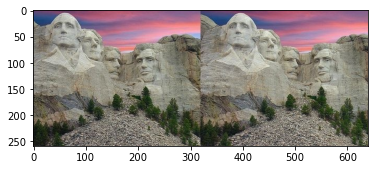

In [137]:
image_files = sorted(glob('./images/Stereo Correspondence/*'))
images = []

im1 = cv2.cvtColor(cv2.imread("./images/Stereo Correspondence/1_1.jpg"), cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(cv2.imread("./images/Stereo Correspondence/1_2.jpg"), cv2.COLOR_BGR2RGB)
im = cv2.hconcat([im1,im2])
print(im1.shape,im2.shape)
plt.imshow(im)
images.append(im)

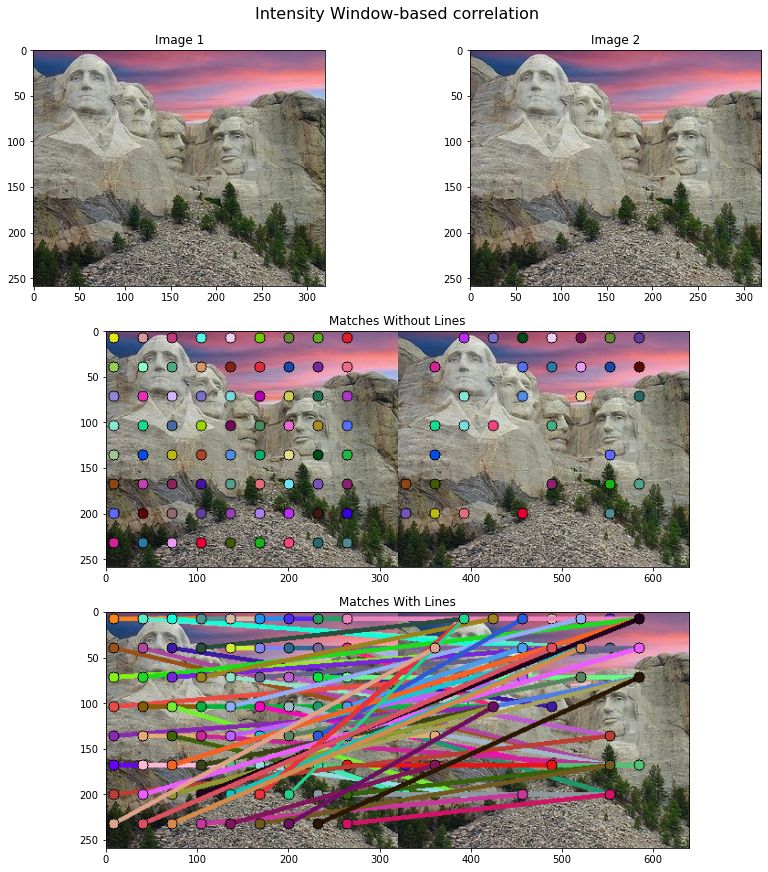

In [138]:
def Question1(im,im1,im2):
        h, w = gray(im).shape
        left_image = im1      
        right_image = im2

        matches = patch_correlation_matching(gray(left_image), gray(right_image), window_size=32, stride=32)


        fig3 = plt.figure(constrained_layout=True,figsize=(12, 12))
        gs = fig3.add_gridspec(3, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Image 1')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Image 2')
        plt.imshow(right_image)
        f3_ax3 = fig3.add_subplot(gs[1, :])
        f3_ax3.set_title('Matches Without Lines')
        plt.imshow(draw_matches(im, matches, 16))
        f3_ax4 = fig3.add_subplot(gs[-1, :])
        f3_ax4.set_title('Matches With Lines')
        plt.imshow(draw_matches(im, matches, 16, draw_lines=True))
        fig3.suptitle('Intensity Window-based correlation', fontsize=16)
        plt.show()
        
Question1(im,im1,im2)

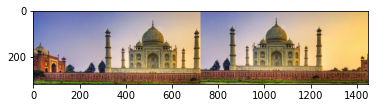

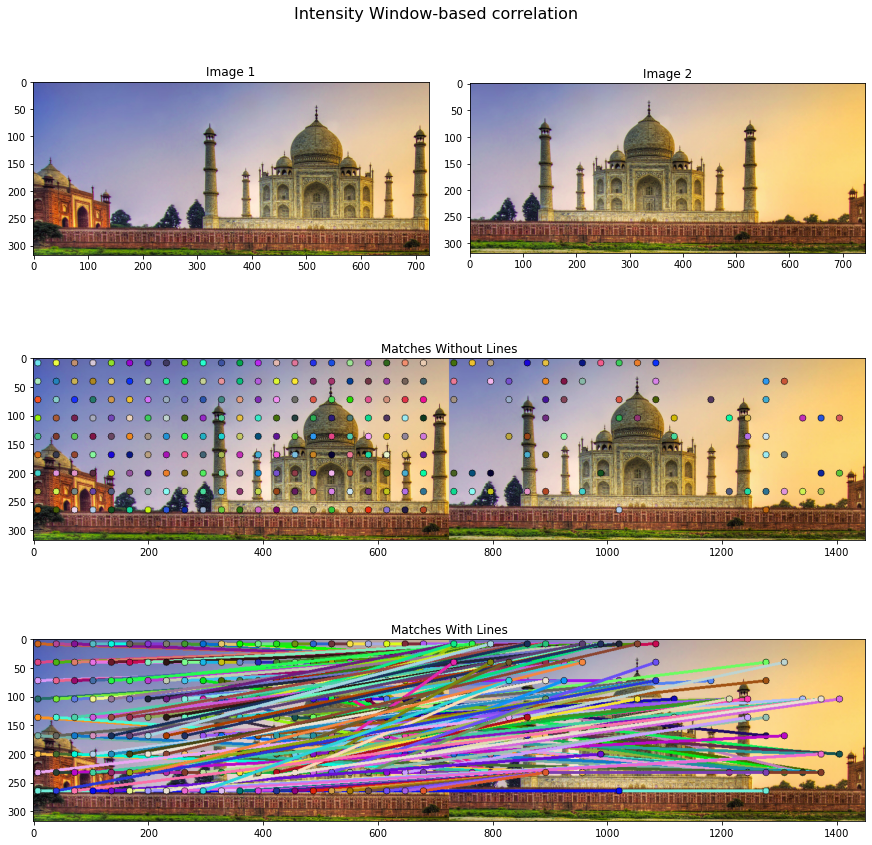

In [139]:
im1 = cv2.cvtColor(cv2.imread("./images/Stereo Correspondence/2_1.png"), cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(cv2.imread("./images/Stereo Correspondence/2_2.png"), cv2.COLOR_BGR2RGB)

cm = cv2.resize(im2, (725, 317), 
               interpolation = cv2.INTER_NEAREST)
im = cv2.hconcat([im1,cm])
plt.imshow(im)
images.append(im)
Question1(im,im1,im2)

(720, 1280, 3) (720, 1280, 3)


<ipython-input-135-269cd238ec21>:8: RuntimeWarning: invalid value encountered in double_scalars
  n_corr = np.sum(image1*image2) / np.sqrt( np.sum(image1**2) * np.sum(image2**2))


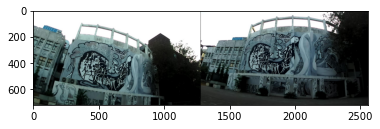

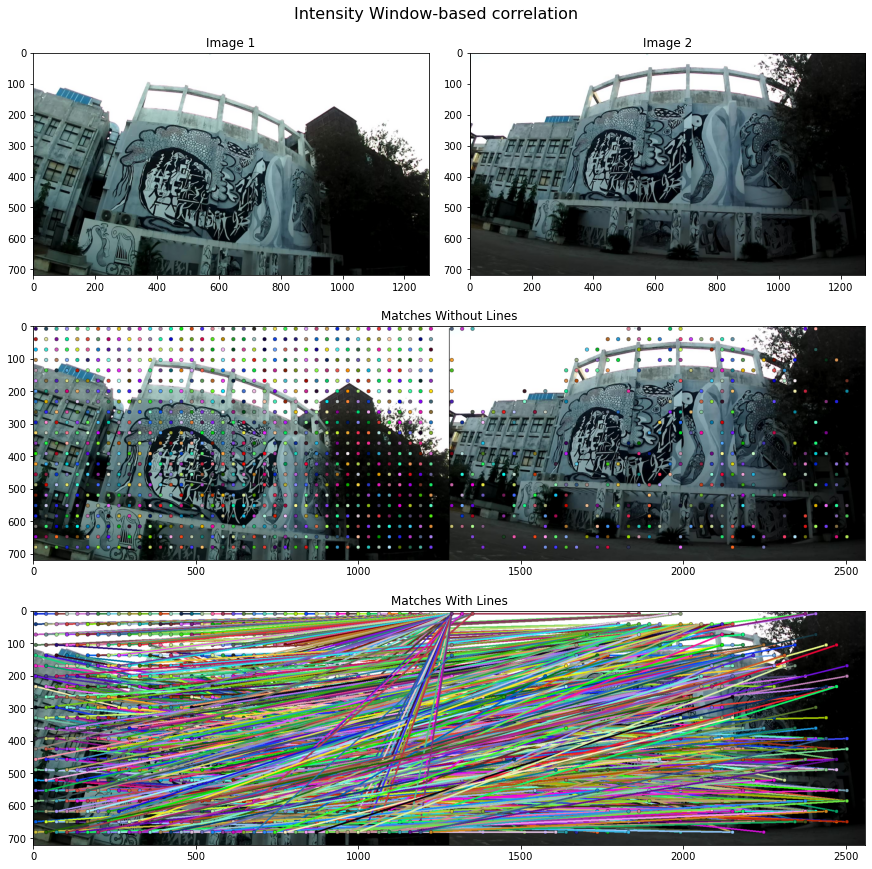

In [140]:
im1 = cv2.cvtColor(cv2.imread("./images/Stereo Correspondence/3_1.jpg"), cv2.COLOR_BGR2RGB)
im2 = cv2.cvtColor(cv2.imread("./images/Stereo Correspondence/3_2.jpg"), cv2.COLOR_BGR2RGB)
im = cv2.hconcat([im1,im2])
print(im1.shape,im2.shape)
plt.imshow(im)
Question1(im,im1,im2)
images.append(im)

# Q2 :  Select few points in the first image and then plot their corresponding epipolar lines on the second. Repeat the same for the second image.

#### Function to draw the epipolar lines on the images

In [141]:
def plot_epipolar_lines(image1, image2, x, xs, F):
    # Find epilines corresponding to points in right image (second image) and
    # drawing its lines on left image
    lines1 = F@xs.T
    lines1 = lines1.reshape(-1,3)
    img5,img6 = drawlines(image1,image2,lines1,x,xs)

    # Find epilines corresponding to points in left image (first image) and
    # drawing its lines on right image
    lines2 = F.T@x.T
    lines2 = lines2.reshape(-1,3)
    img3,img4 = drawlines(image2,image1,lines2,xs,x)
    
    return img5, img3

In [142]:
def SIFT_feature_extractor(image1, image2, nfeatures=500):
    # Feature Key Point Extractor
    sift = cv2.xfeatures2d.SIFT_create(nfeatures=nfeatures)
    
    # Create BF Matcher
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    
    # Find keypoints and descriptors 
    kp1, desc1 = sift.detectAndCompute(image1, None)    
    kp2, desc2 = sift.detectAndCompute(image2, None)

    # Match descriptors
    matches = bf.match(desc1, desc2) 

    # Sort the matches in the order of their distance
    matches = sorted(matches, key = lambda x:x.distance)[:50]

    x = np.float32(np.array([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2))
    xs = np.float32(np.array([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2))
    
    return x, xs, matches

<ipython-input-134-f61778130804>:15: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img1 = cv2.circle(img1,tuple(pt1[0]),5,color,-1)
<ipython-input-134-f61778130804>:16: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img2 = cv2.circle(img2,tuple(pt2[0]),5,color,-1)


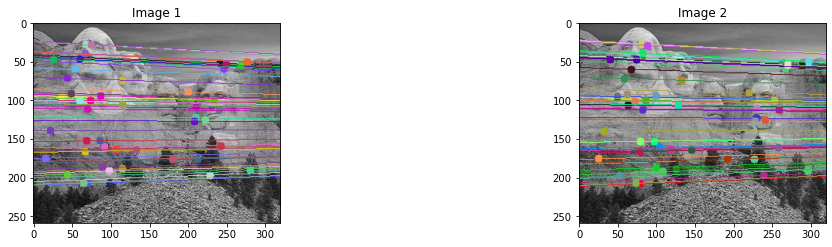

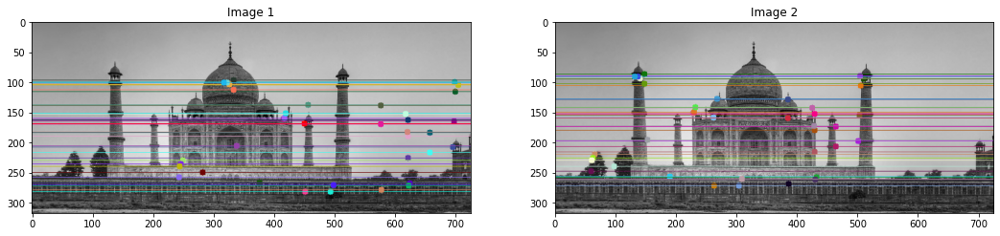

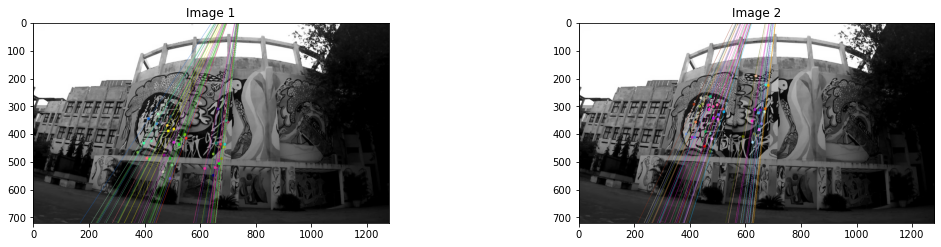

In [154]:
def Question2():
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]
        
        x, xs, _ = SIFT_feature_extractor(left_image, right_image)
        
        F, mask = cv2.findFundamentalMat(x, xs, cv2.FM_RANSAC, 0.1)
        
        ll, rr = plot_epipolar_lines(gray(right_image), gray(right_image), x, xs, F)
        
        fig3 = plt.figure(constrained_layout=True,figsize=(15, 15))
        gs = fig3.add_gridspec(5, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Image 1')
        plt.imshow(ll)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Image 2')        
        plt.imshow(rr)

Question2()

# Q3 : Stereo Rectification and Greedy Matching Stereo Correspondance

***
In order to perform Stereo Rectification, we perform the following steps,

* Find corresponding points in the two views
* Estimate the Fundamental (Uncalibrated Camera) or the Essential Matrix (Calibrated Camera) from the given two views
* Estimate the homography between the two views such that the epipolar lines become parallel for both the views
* Warp the views to the desired homography and obtain the Stereo Rectified pair of images.

In [143]:
def stereo_rectification(image1, image2, nfeatures=500):
    # Feature Key Point Extractor
    sift = cv2.xfeatures2d.SIFT_create(nfeatures=nfeatures)
    
    # Create BF Matcher
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
    
    # Find keypoints and descriptors 
    kp1, desc1 = sift.detectAndCompute(image1, None)    
    kp2, desc2 = sift.detectAndCompute(image2, None)

    # Match descriptors
    matches = bf.match(desc1, desc2) 

    # Sort the matches in the order of their distance
    matches = sorted(matches, key = lambda x:x.distance)[:50]

    x = np.float32(np.array([ kp1[m.queryIdx].pt for m in matches ]).reshape(-1,1,2))
    xs = np.float32(np.array([ kp2[m.trainIdx].pt for m in matches ]).reshape(-1,1,2))

    F, mask = cv2.findFundamentalMat(x, xs, cv2.FM_RANSAC, 0.1)

    # Filter out the outliers. Considering only the inliers.
    x = x[mask.ravel() == 1]
    xs = xs[mask.ravel() == 1]

    # Compute the Stereo Correction Homography for both images
    ret, H1, H2 = cv2.stereoRectifyUncalibrated(x, xs, F, image1.shape[0:2])

    # Warp the images
    if ret:
        image1_rectified = cv2.warpPerspective(image1, H1, (image1.shape[1], image1.shape[0]))
        image2_rectified = cv2.warpPerspective(image2, H2, (image2.shape[1], image2.shape[0]))

    return image1_rectified, image2_rectified, x, xs, F, H1, H2

## Stereo Correspondance Greedy
* After stereo rectifying the images, we are sure that the disparity in the y-direction is zzero and the disparity is present only in the x-direction.
* Therefore, all the epipolar lines in both the images are parallel.
* Hence, we need to check only the epipolar lines in order to find the corresponding matches. We perform the intensity based epipolar lines matching by comparing the a block in the first image in the corresponding scan line of the second image. 
* We find the highest correlation and return the matches.

In [145]:
def stereo_correspondance_greedy(image_left, image_right, window_size, stride):
    # Get the shape of the input images
    h1, w1 = image_left.shape
    h2, w2 = image_right.shape

    matches = np.zeros((0,4))

    # Loop over the first image to generate query patches
    for i in range(0, h1-window_size, stride):
        for j in range(0, w1-window_size, stride):
            # Extract the query patch
            query_patch = image_left[i:i+window_size, j:j+window_size]

            best_n_corr = -9999999
            best_match = (0,0)
            ii = i
            for jj in range(0, w2-window_size, stride):
                # Extract patch
                patch = image_right[ii:ii+window_size, jj:jj+window_size]

                # Perform Normalised Cross Correlation
                n_corr = n_cross_corr(query_patch, patch)
                # n_corr = corr(query_patch.flatten(), patch.flatten())

                # If Normalised Cross Correlation value if higher than the current best then update
                if n_corr > best_n_corr:
                    best_n_corr = n_corr
                    best_match = (ii, jj)

            # Best Match for the current query patch            
            matches = np.concatenate((matches,np.array([[i, j, best_match[0], best_match[1]]])), axis=0)
    return matches

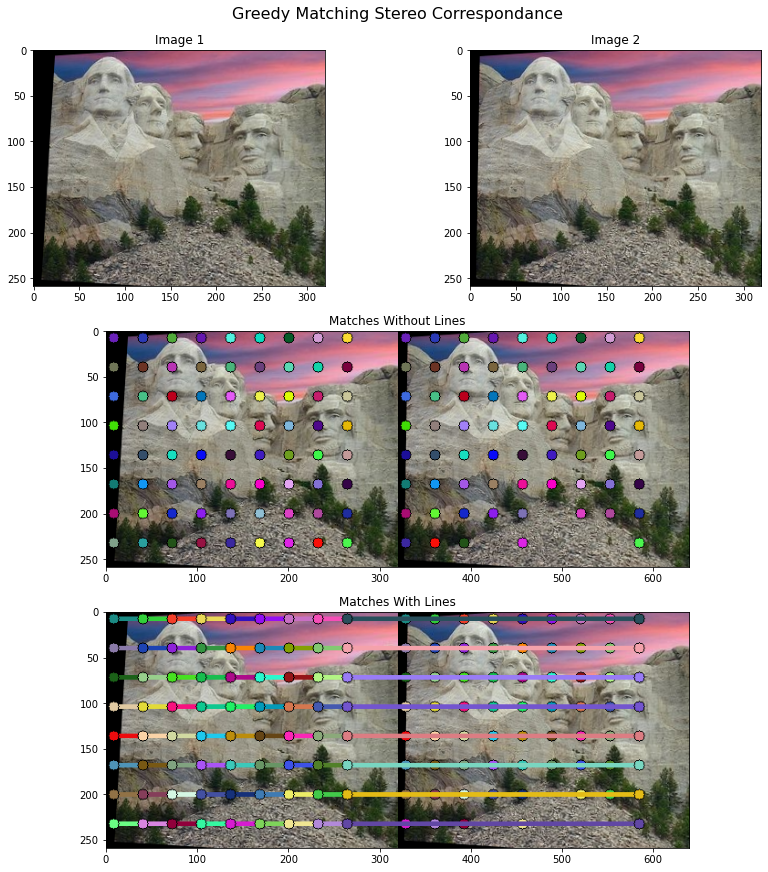

<ipython-input-135-269cd238ec21>:8: RuntimeWarning: invalid value encountered in double_scalars
  n_corr = np.sum(image1*image2) / np.sqrt( np.sum(image1**2) * np.sum(image2**2))


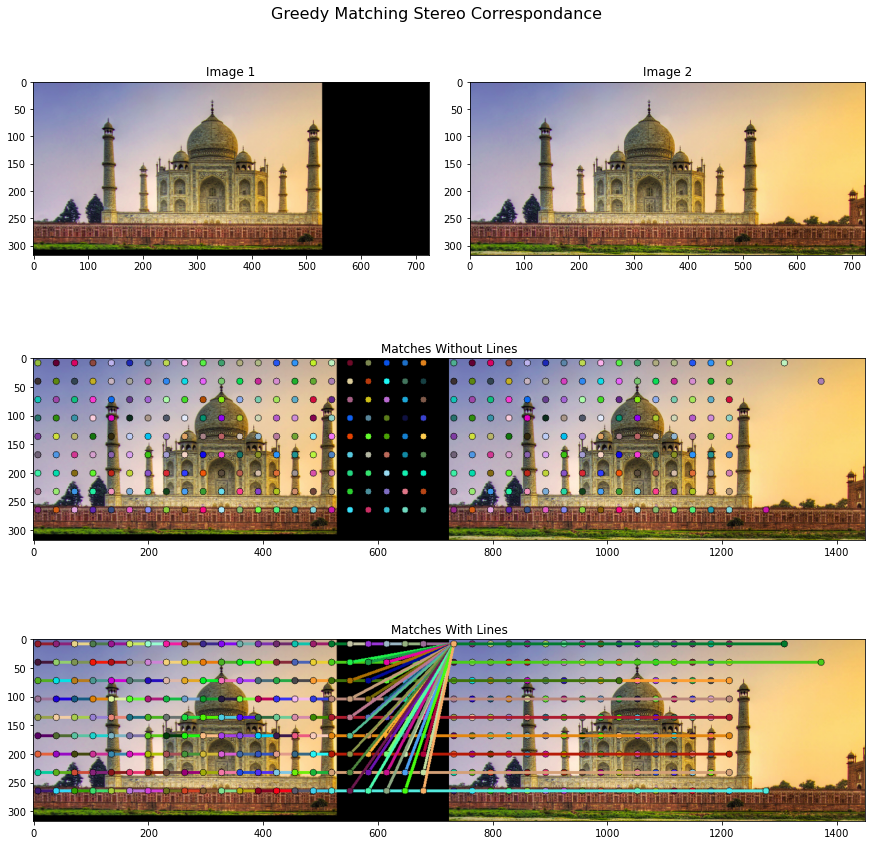

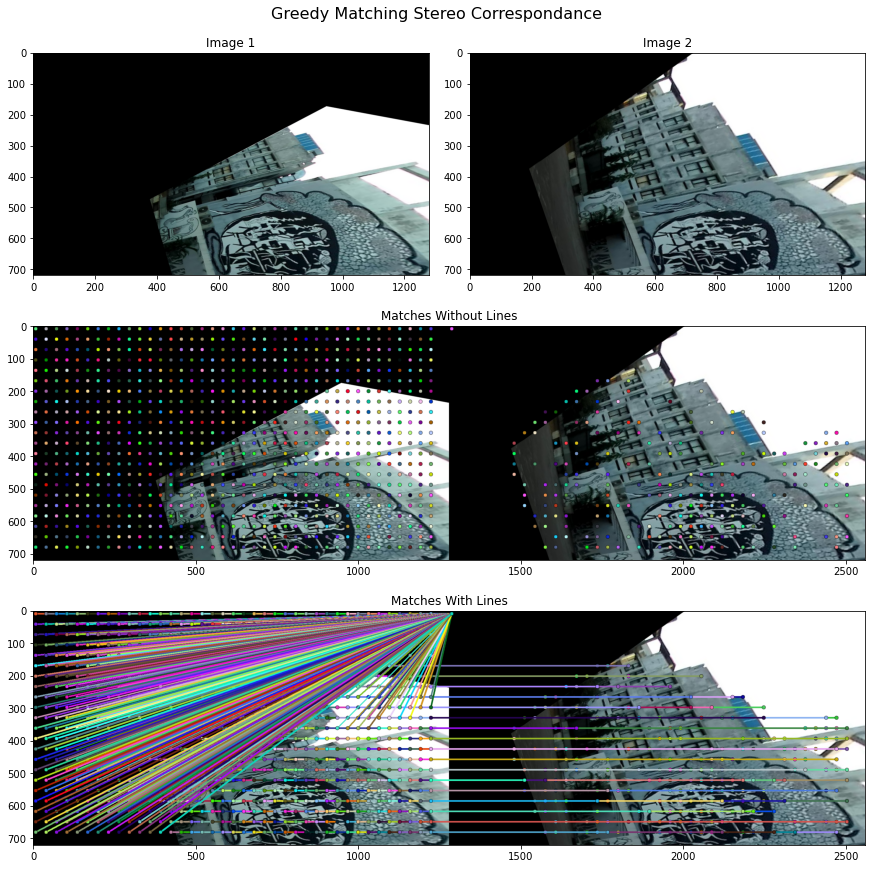

In [146]:
def Question3(is_rectified=False):
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]
        
        if is_rectified:
            left_image, right_image, x, xs, F, H1, H2 = stereo_rectification(left_image, right_image)
            img2 = np.zeros((h,w,3)).astype('uint8')
            img2[0:h, 0:w//2,:] = left_image
            img2[0:h,w//2:,:] = right_image
            img = img2

        matches = stereo_correspondance_greedy(gray(left_image), gray(right_image), 32, 32)

        fig3 = plt.figure(constrained_layout=True,figsize=(12, 12))
        gs = fig3.add_gridspec(3, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Image 1')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Image 2')
        plt.imshow(right_image)
        f3_ax3 = fig3.add_subplot(gs[1, :])
        f3_ax3.set_title('Matches Without Lines')
        plt.imshow(draw_matches(img, matches, 16))
        f3_ax4 = fig3.add_subplot(gs[-1, :])
        f3_ax4.set_title('Matches With Lines')
        plt.imshow(draw_matches(img, matches, 16, draw_lines=True))
        fig3.suptitle('Greedy Matching Stereo Correspondance', fontsize=16)
        plt.show()
        
Question3(is_rectified=True)

# Q4 - 


#### Intensity Based Window Matching
***
* This method relies on the fact that if the correlation between the intensities of the two block is large enough then, they are similar. 
* This however does not account for the fact that the ordering might not be the same. It does not take ordering constraint into account.
* This method greedily selects the highest correlation patch as the best matching patch and matches the two blocks
* Matches obtained from this method are not always accurate.
* Window size and the stride taken, also makes a huge difference in the quality of the matches obtained depending on how finely textured the image is.


#### Greedy Stereo Correspondance Intensity Based Window Matching after Stereo Correction
* In this method we exploit the fact that the images are stereo corrected, therefore the epipolar lines must be parallel and the disparity in the y axis must be 0.
* Using this we can maintain the ordering constrain in the y direction, but we still don't have the ordering constraint in the x direction.
* We perform block matching only along the rows, due to stereo normalisation.
* This reduces our search space to 1D, and we get better matches than the above two methods mentioned.


# Q5 Bonus : SIFT-based Matching comparision with Intensity Window-based Correlation
* As we can see from the results below
* It is observed that intensity window based correlation is not a good descriptor to match points. 
* We can see that points that are matched in the image are not similar, but their intensity profile may be. 
* SIFT on the other hand does a good job of matching points to the corresponding points in the other image due to its scale pyramid form of keypoint detection.
* Since the matched points in SIFT were more accurate, the rectification is correct when using the SIFT descriptor. * Intensity window based correlation on the other hand has makes the image warp with a wrong homography.

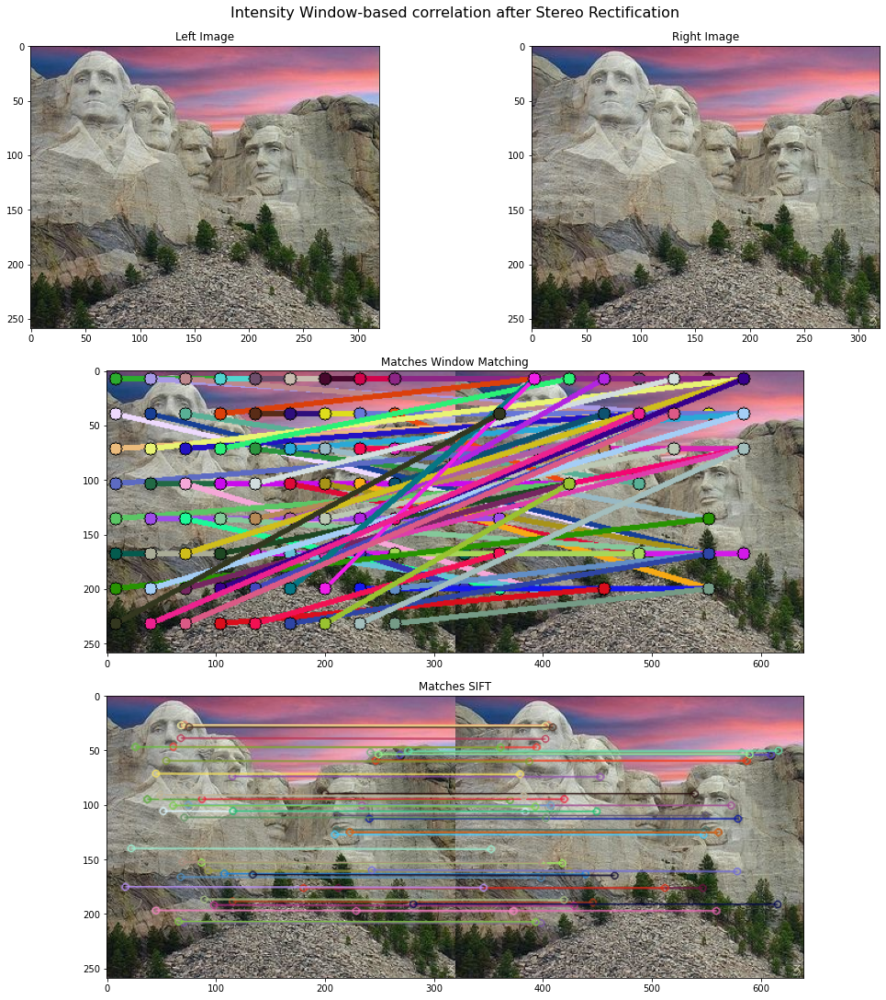

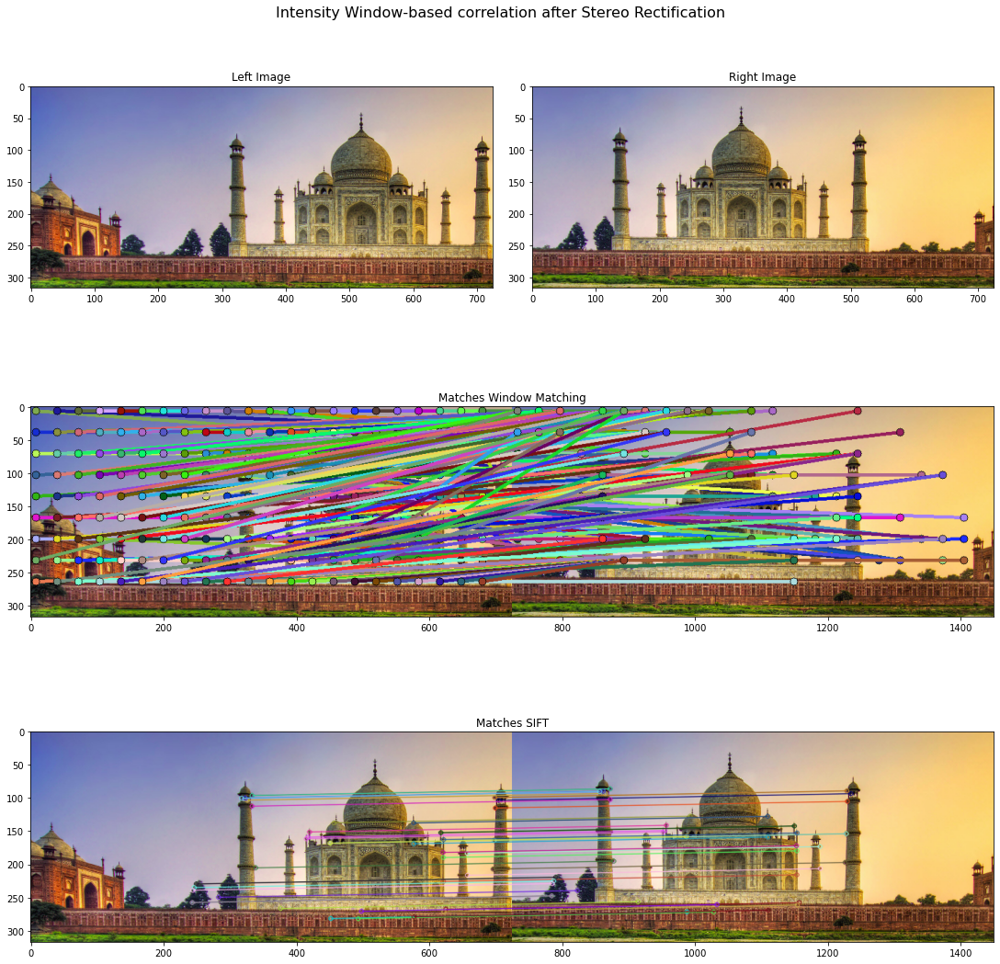

<ipython-input-135-269cd238ec21>:8: RuntimeWarning: invalid value encountered in double_scalars
  n_corr = np.sum(image1*image2) / np.sqrt( np.sum(image1**2) * np.sum(image2**2))


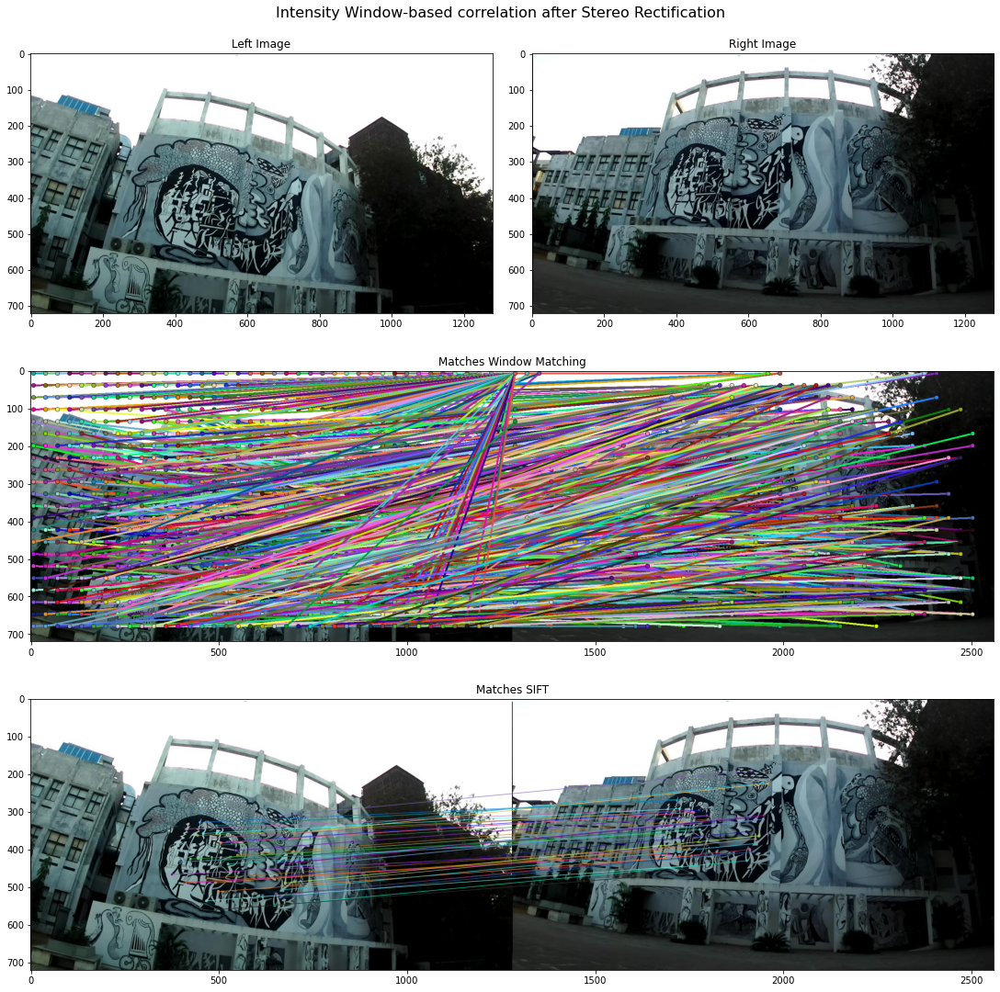

In [150]:
def Bonus():
    for img in images:

        h, w = gray(img).shape
        left_image = img[:, :w//2]        
        right_image = img[:, w//2:]

        matches_window = patch_correlation_matching(gray(left_image), gray(right_image), window_size=32, stride=32)
        
        
        # Feature Key Point Extractor
        sift = cv2.xfeatures2d.SIFT_create(nfeatures=500)
        # Create BF Matcher
        bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)
        # Find keypoints and descriptors 
        kp1, desc1 = sift.detectAndCompute(left_image, None)    
        kp2, desc2 = sift.detectAndCompute(right_image, None)
        # Match descriptors
        matches_sift = bf.match(desc1, desc2) 
        # Sort the matches in the order of their distance
        matches_sift = sorted(matches_sift, key = lambda x:x.distance)[:50]
        img3 = cv2.drawMatches(left_image, kp1, right_image, kp2, matches_sift, None, flags=2)

        fig3 = plt.figure(constrained_layout=True,figsize=(15, 15))
        gs = fig3.add_gridspec(3, 2)
        f3_ax1 = fig3.add_subplot(gs[0, 0])
        f3_ax1.set_title('Left Image')
        plt.imshow(left_image)
        f3_ax2 = fig3.add_subplot(gs[0, 1])
        f3_ax2.set_title('Right Image')
        plt.imshow(right_image)
        f3_ax7 = fig3.add_subplot(gs[1, :])
        f3_ax7.set_title('Matches Window Matching')
        plt.imshow(draw_matches(img, matches_window, 16, True))
        f3_ax8 = fig3.add_subplot(gs[2, :])
        f3_ax8.set_title('Matches SIFT')
        plt.imshow(img3)
        fig3.suptitle('Intensity Window-based correlation after Stereo Rectification', fontsize=16)
        plt.show()

Bonus()